<a href="https://colab.research.google.com/github/y-oth/dst_assessment2/blob/main/Jemma%20H/LRP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Layer wise Relevance Propagation
Layer-wise relevance propagation (LRP) is a backward explanation technique for neural networks. A forward pass is first computed and the activations $ a_j $, are stored at each layer. Then, instead of backpropagating gradients, LRP backpropagates relevance values $ R $, starting from the output neuron. A positive relevance indicates that a neuron contributes in favour of the prediction, whereas negative relevance indicates contribution against the prediction


If $ j $ and $ k $ are neurons at two consecutive layers of the neural network, such that $ j $ is in the lower layer (closest to the input) and $ k$ is the upper layer (closest to the output). We say the the forwards contribution from $ j \rightarrow k $ is $ z_{jk} = a_j w_{jk} $. Where $ a_j $ is the activation at neuron $ j $  such that $ a_k = \max(0, \sum _{0,j} a_jw_{jk} )$ and $ w_{jk} $ is the weight. We set $ a_0 = 1 $ and $ w_{0k} $ to be the neuron bias.



We define the propagating relevance score at a given layer onto the neurons of the lower layer to be
\begin{equation}
    R_j = \sum _k \frac{z_{jk}}{\sum_j z_{jk} } R_k
\end{equation}





This satisfies the layer-wise conservation property $ \sum _j R_j = \sum _k R_k $ and consequently the global conservation property $ \sum _i R_i = f(x) $

We can see the LRP procedure in the figure below.

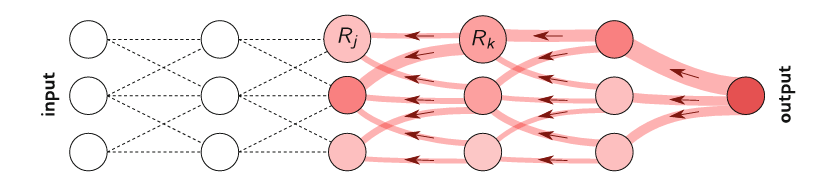
### Propagation rules

We will include three propagation rules in the implementation of LRP, they are the following.

Basic Rule, LRP-0, which uses the raw contributions with no stabilisations

$ R_j = \sum _k \frac{a_j w_{jk} }{\sum_{0,j}a_j w_{jk} } R_k $


Epsilon Rule, LPR-$\epsilon$

$ R_j = \sum _k \frac{a_j w_{jk} }{\epsilon + \sum_{0,j}a_j w_{jk} } R_k $

$ \epsilon $ prevents division by small denominators. It absorbs some of the relevance when the contributions of the activation $ k $ are weak or contradictory.


Gamma Rule, LRP-$\gamma$

$ R_j = \sum _k \frac{a_j ( w_{jk} + \gamma w_{jk}^+) }{\sum_{0,j}a_j ( w_{jk} + \gamma w_{jk}^+) } R_k $

This favors the effect of the positive contributions, and $ \gamma $ controls how much is favoured. As $ \gamma $ increases the negative contributions start to disappear.


We will use LRP-0 for the upper layers since the activations are stable and linear.
In the middle layer there are more noise and so using LRP-$\epsilon $ will filter the most accurate factors.
In the lower layer we will use LRP-$\gamma $ as it spreads the relevance uniformly across the features.




### Implementing LRP


We will consider a general rule:
\begin{equation}
     R_j = \sum _k \frac{a_j \rho (w_{jk}) }{\epsilon + \sum_{0,j}a_j \rho ( w_{jk}) } R_k
\end{equation}

And the computation can be broken down into the following steps:



\begin{array}{ll}
\forall k:\quad z_k = \epsilon + \sum_{j} a_j \cdot \rho(w_{jk})
    & \text{(forward pass)} \\[6pt]
\forall k:\quad s_k = \frac{R_k}{z_k}
    & \text{(element-wise division)} \\[6pt]
\forall j:\quad c_j = \sum_{k} \rho(w_{jk}) \cdot s_k
    & \text{(backward pass)} \\[6pt]
\forall j:\quad R_j = a_j \cdot c_j
    & \text{(element-wise product)}
\end{array}


We can also express $ c_j $ as the gradient so
$ c_j = [ \nabla ( \sum_k z_k (a) \dot s_k )]_j $.




implementing this rule in code gives us:

```
def relprop(a, layer, R):
    z = epsilon + rho(layer).forward(a)
    s = R / (z + 1e-9)
    (z * s.data).sum().backward()
    c = a.grad
    R = a * c
    return R
```
### References
https://www.sciencedirect.com/science/article/pii/S1051200417302385#se0120

Layer-Wise Relevance Propagation: An Overview:
https://link.springer.com/chapter/10.1007/978-3-030-28954-6_10



## Importing data

In [1]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip -q "/content/drive/MyDrive/DST assessment 2/brain tumor dataset.zip" -d "/content/data"

In [3]:

!ls /content/data

Testing  Training


Loaded image: /content/data/Training/no_tumor/image(206).jpg


(np.float64(-0.5), np.float64(224.5), np.float64(224.5), np.float64(-0.5))

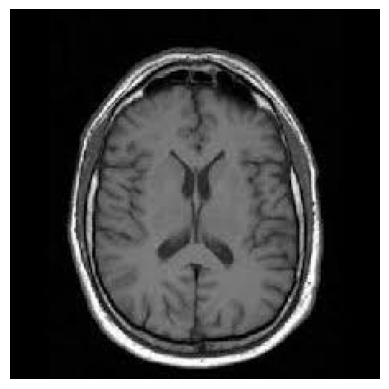

In [4]:

import os
from PIL import Image
import matplotlib.pyplot as plt

root = "/content/data/Training"

# Find the first image in the training folder
image_path = None
for subdir, dirs, files in os.walk(root):
    for file in files:
        if file.lower().endswith((".png", ".jpg", ".jpeg")):
            image_path = os.path.join(subdir, file)
            break
    if image_path:
        break

print("Loaded image:", image_path)

img = Image.open(image_path)
plt.imshow(img)
plt.axis("off")

In [5]:

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder("/content/data/Training", transform=transform)
test_dataset  = datasets.ImageFolder("/content/data/Testing",  transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [6]:
train_dataset.classes


['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']

In [7]:
from collections import Counter

counter = Counter([label for _, label in test_dataset])
print(counter)

# If you want class names
idx_to_class = {v: k for k, v in test_dataset.class_to_idx.items()}
for idx, count in counter.items():
    print(idx_to_class[idx], ":", count)


Counter({1: 115, 2: 105, 0: 100, 3: 74})
glioma_tumor : 100
meningioma_tumor : 115
no_tumor : 105
pituitary_tumor : 74


In [8]:

images, labels = next(iter(test_loader))
print(images.shape, labels.shape)


images2, labels2 = next(iter(train_loader))
print(images2.shape, labels2.shape)

torch.Size([32, 3, 224, 224]) torch.Size([32])
torch.Size([32, 3, 224, 224]) torch.Size([32])


(np.float64(-0.5), np.float64(1809.5), np.float64(453.5), np.float64(-0.5))

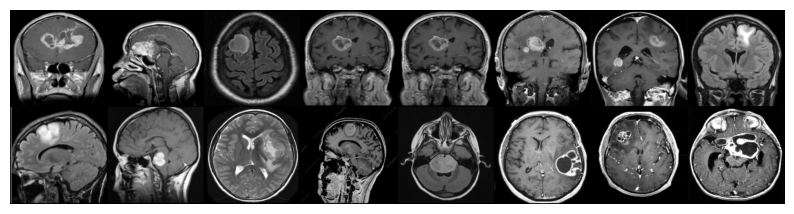

In [9]:

import matplotlib.pyplot as plt
import torchvision

plt.figure(figsize=(10,10))
plt.imshow(torchvision.utils.make_grid(images[:16]).permute(1,2,0))
plt.axis("off")


## Simple CNN


In [10]:
import torch.nn as nn

class SimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1),
            nn.ReLU(), #applies non linearity
            nn.MaxPool2d(2), #reduce spatial size and keep important features

            nn.Conv2d(16, 32, 3, padding=1), #16 features to 32 outputs
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.fc = nn.Sequential(
            nn.Flatten(), #converrtr to 1D vector
            nn.Linear(32 * 56 * 56, 64), #convetrs map to 64 neurons
            nn.ReLU(),
            nn.Linear(64, len(train_dataset.classes)), #64 goes to 4 tumor classes
        )

    def forward(self, x): #define input forward through network
        x = self.conv(x)
        return self.fc(x)



In [11]:
import torchvision.models as models
import torch.nn as nn


In [12]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [13]:
model = SimpleCNN()
model = model.to(device)

criterion = torch.nn.CrossEntropyLoss() #
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
epochs = 5  # increase later

for epoch in range(epochs):
    model.train() #into trianing mode
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images) #puts MRI j
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step() #wher emodel learns tumour features

        running_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = correct / total * 100
    print(f"Epoch [{epoch+1}/{epochs}]  Loss: {running_loss:.4f}  Train Acc: {train_acc:.2f}%")


Epoch [1/5]  Loss: 96.7614  Train Acc: 53.31%
Epoch [2/5]  Loss: 69.2010  Train Acc: 67.87%
Epoch [3/5]  Loss: 54.2757  Train Acc: 75.68%
Epoch [4/5]  Loss: 46.8469  Train Acc: 79.90%
Epoch [5/5]  Loss: 40.7063  Train Acc: 82.33%


## LRP

In [14]:
import torch.nn as nn
#LRP code
def get_layers(model):
    layers = []

    # Conv part
    for l in model.conv:
        layers.append(l)

    # FC part
    for l in model.fc:
        layers.append(l)

    return layers
import copy

def new_layer(layer, g):
    """Clone a layer and pass its parameters through function g."""
    layer = copy.deepcopy(layer)
    try:
        layer.weight = nn.Parameter(g(layer.weight))
    except AttributeError:
        pass
    try:
        layer.bias = nn.Parameter(g(layer.bias))
    except AttributeError:
        pass
    return layer

def apply_lrp_simplecnn(model, image):
    original_layers = get_layers(model)

    # Create a modified layers list for LRP: replace MaxPool2d with AvgPool2d
    lrp_layers = []
    for l in original_layers:
        if isinstance(l, nn.MaxPool2d):
            # Ensure attributes match for correct AvgPool2d creation
            lrp_layers.append(nn.AvgPool2d(
                kernel_size=l.kernel_size,
                stride=l.stride,
                padding=l.padding,
                ceil_mode=l.ceil_mode if hasattr(l, 'ceil_mode') else False
            ))
        else:
            lrp_layers.append(l)

    # ---- Step 1: forward: store activations ----
    x = image.unsqueeze(0)
    activations = [x]

    for layer in lrp_layers: # Use the modified layers here
        x = layer(x)
        activations.append(x)

    # ---- Step 2: One-hot output ----
    output = activations[-1].detach()
    max_idx = torch.argmax(output)

    one_hot = torch.zeros_like(output)
    one_hot[0, max_idx] = output[0, max_idx]     # keep magnitude

    relevances = [None] * len(activations)
    relevances[-1] = one_hot

    # ---- Step 3: Backward relevance propagation ----
    for i in range(len(lrp_layers)-1, -1, -1): # Iterate over lrp_layers

        layer = lrp_layers[i] # Use lrp_layers here

        # Special handling for nn.Flatten: reshape relevance
        if isinstance(layer, nn.Flatten):
            # Relevance for the input to Flatten layer (relevances[i])
            # should be relevances[i+1] (output of Flatten) reshaped
            # to match activations[i] (input to Flatten).
            prev_activation_shape = activations[i].shape
            relevances[i] = relevances[i+1].reshape(prev_activation_shape)
            continue # Already handled, move to next layer

        a = activations[i].clone().detach().requires_grad_(True)
        r = relevances[i+1] # This `r` is the relevance of the output of `layer`

        # Choose LRP rule by layer depth
        # Also include AvgPool2d in this check now
        if isinstance(layer, nn.Conv2d) or isinstance(layer, nn.Linear) or isinstance(layer, nn.AvgPool2d):

            # LRP-gamma for first 2 conv layers (indices 0, 1) and first MaxPool (index 2)
            # which is now AvgPool. So <= 2 is layers 0,1,2
            if i <= 2:
                rho = lambda p: p + 0.25*p.clamp(min=0)
                incr = lambda z: z + 1e-9

            # LRP-epsilon for mid layers

            elif i < len(lrp_layers)-2:
                rho = lambda p: p
                incr = lambda z: z + 1e-6

            # LRP-0 for last linear layer and last ReLU
            else: # i >= 8
                rho = lambda p: p
                incr = lambda z: z + 1e-9

            z = new_layer(layer, rho)(a)
            z = incr(z)

            s = (r / z).data
            (z * s).sum().backward()

            c = a.grad
            relevances[i] = (a * c)

        else:
            # This 'else' block will now only be hit by nn.ReLU layers
            # as Flatten and MaxPool2d are handled explicitly.
            # For ReLU, relevance is passed unchanged, which is correct.
            relevances[i] = relevances[i+1]

    return relevances[0]


## Implemening LRP to simple CNN model



Image 0
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


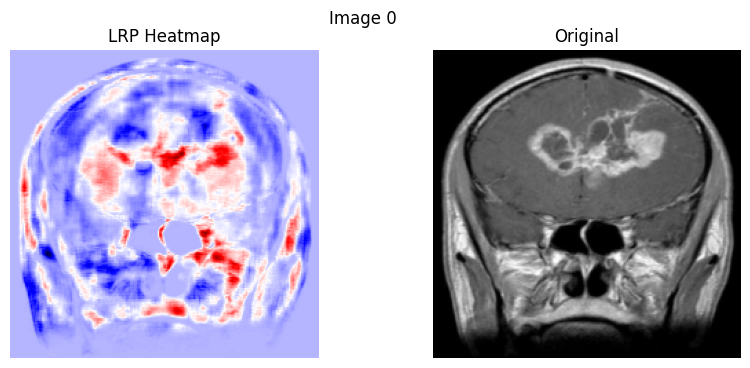


Image 1
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


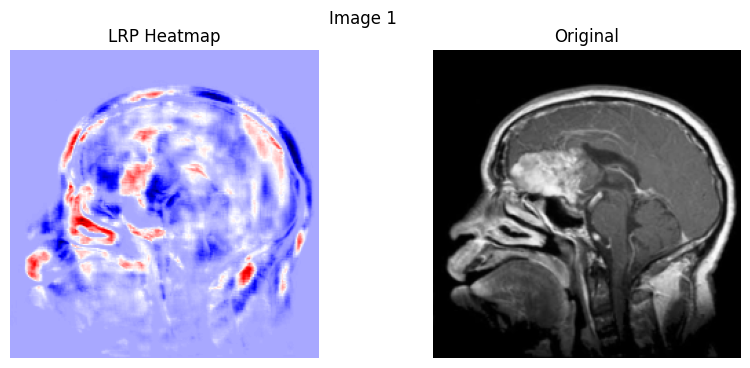


Image 2
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


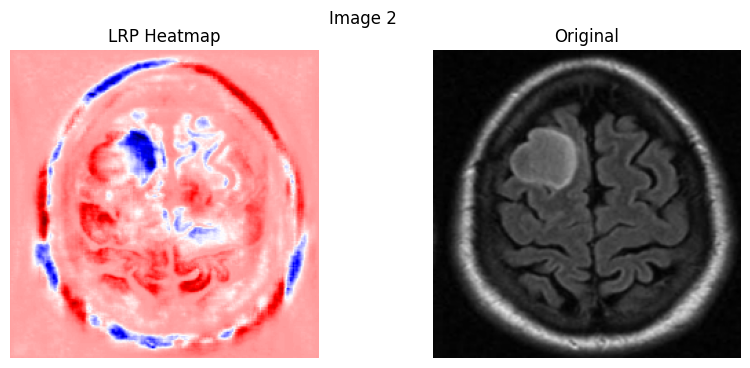


Image 3
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


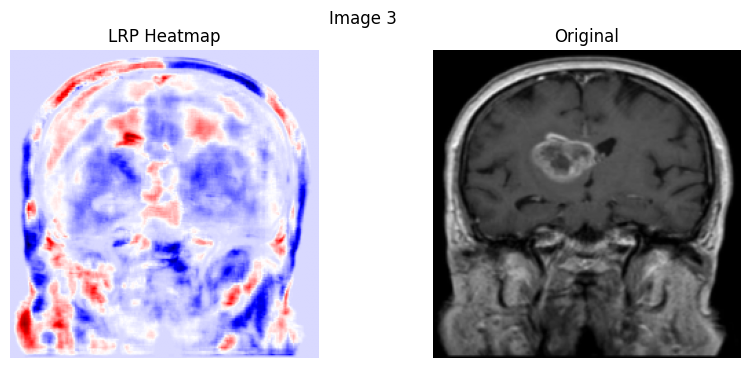


Image 4
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


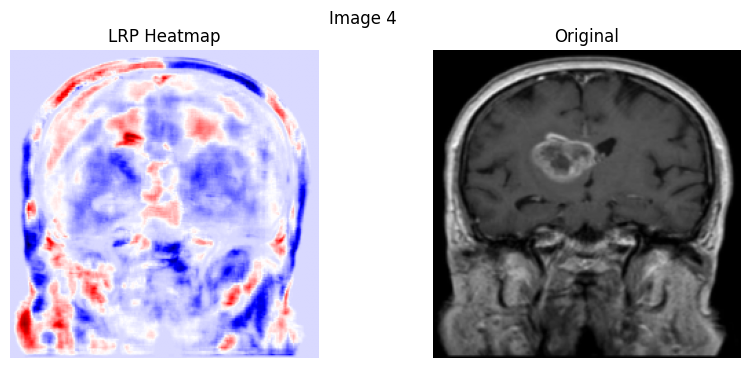


Image 5
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : meningioma_tumor
Correct?  : False


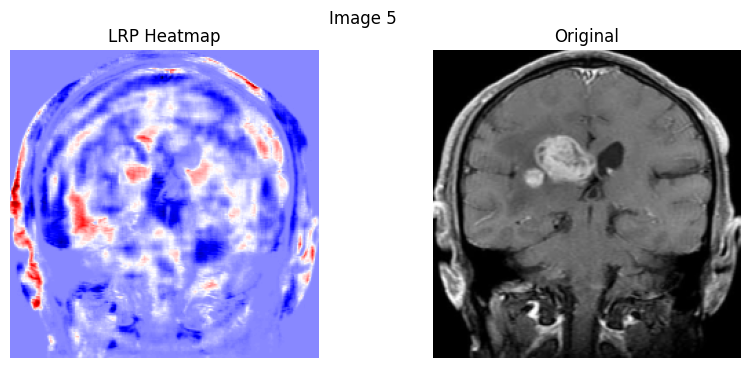


Image 6
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


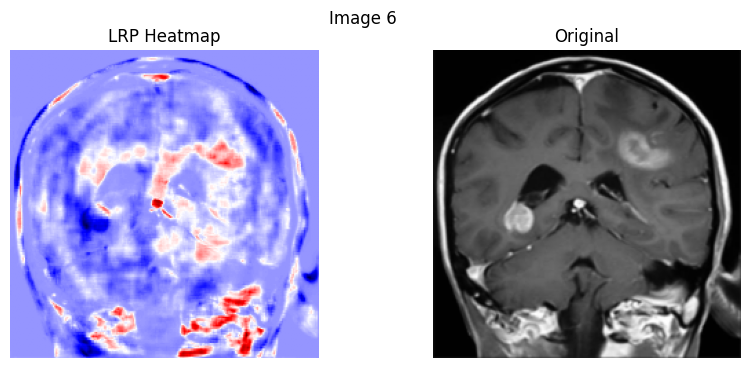


Image 7
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


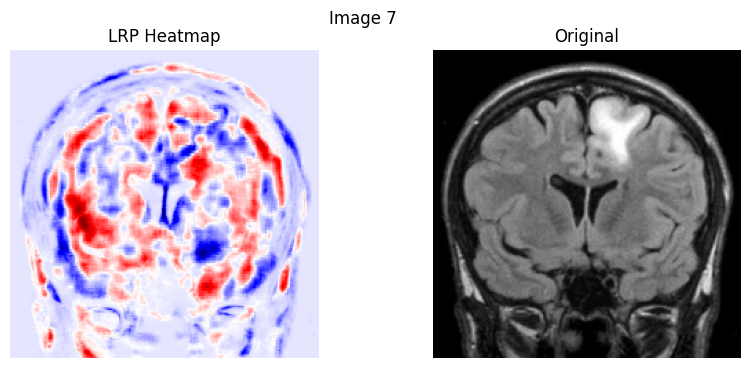


Image 8
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


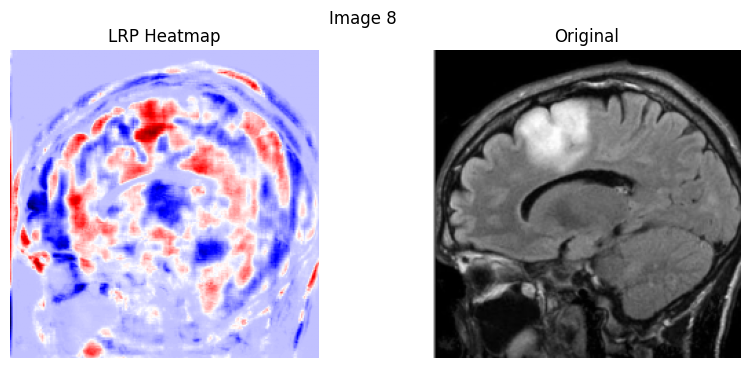


Image 9
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


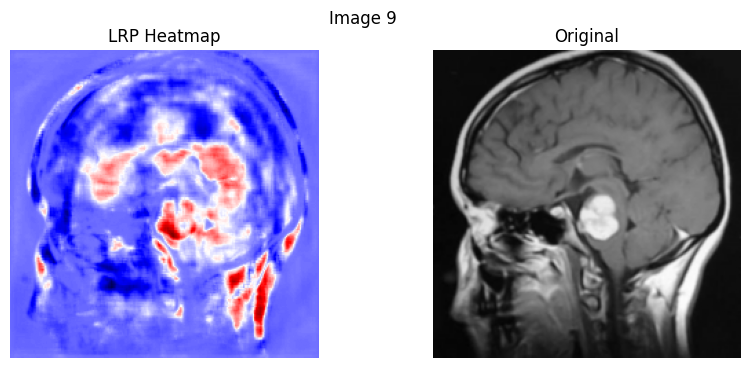


Image 10
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


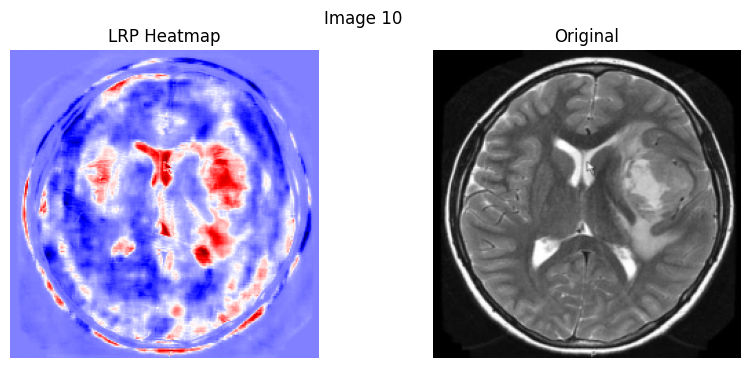


Image 11
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : meningioma_tumor
Correct?  : False


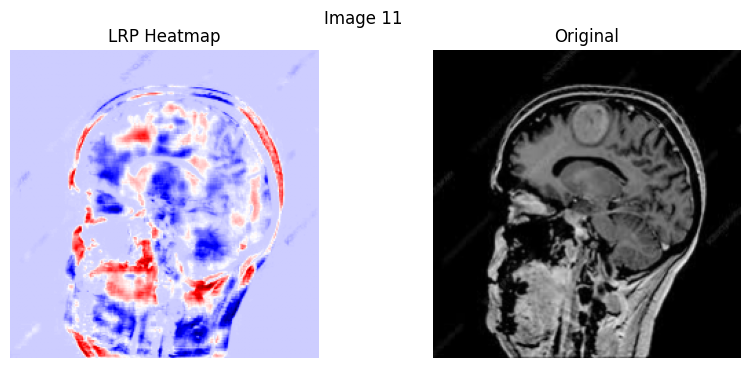


Image 12
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


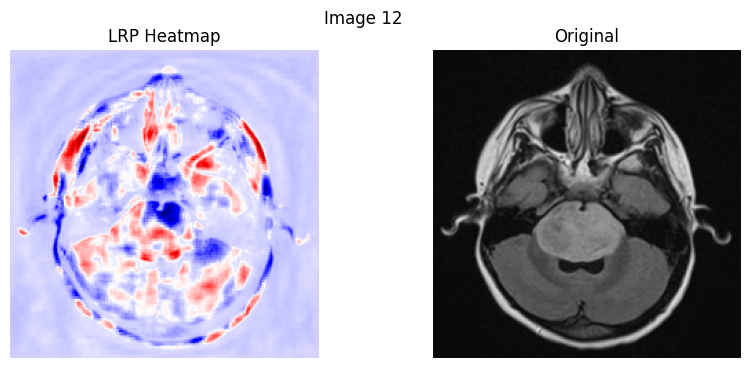


Image 13
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


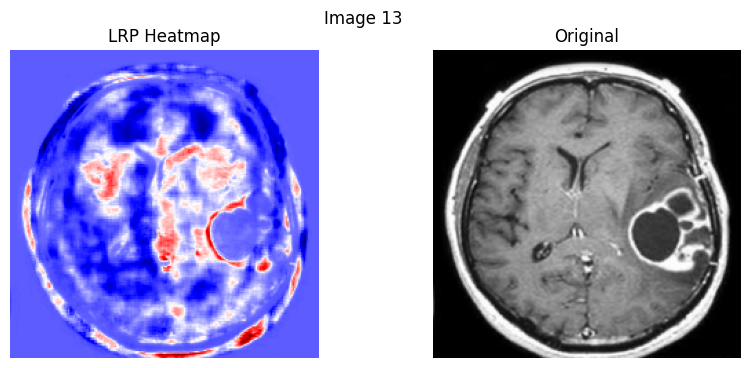


Image 14
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


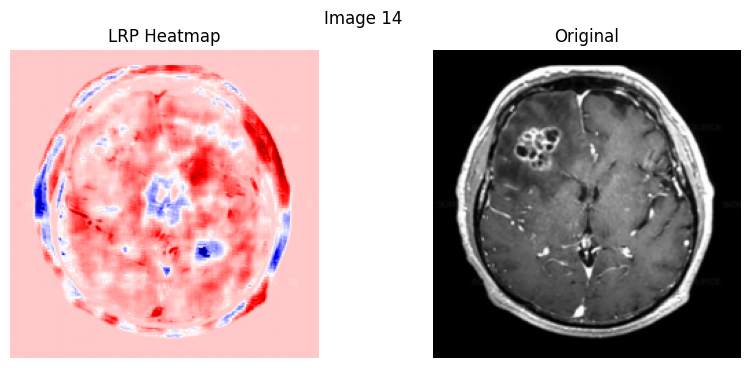


Image 15
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


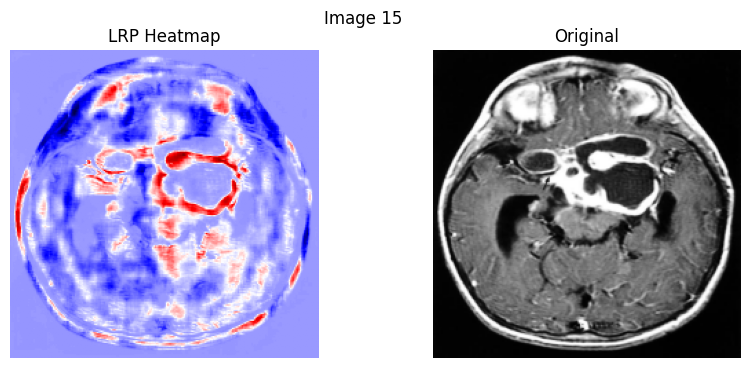


Image 16
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : meningioma_tumor
Correct?  : False


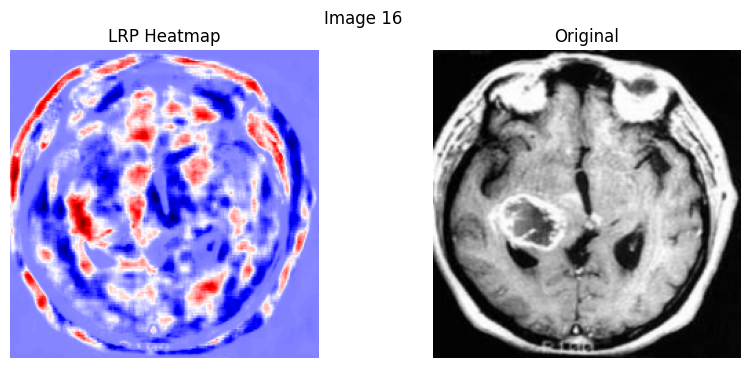


Image 17
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


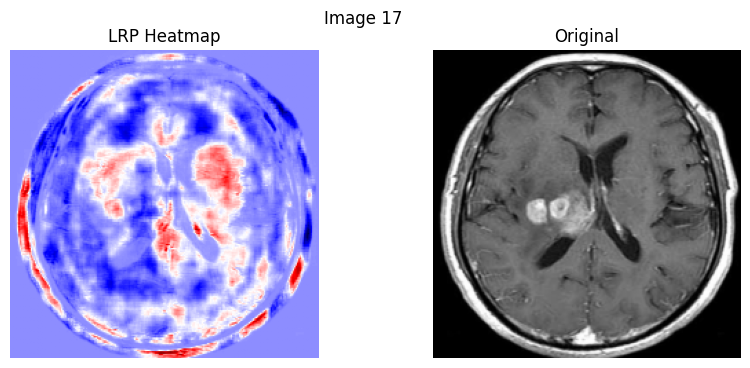


Image 18
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


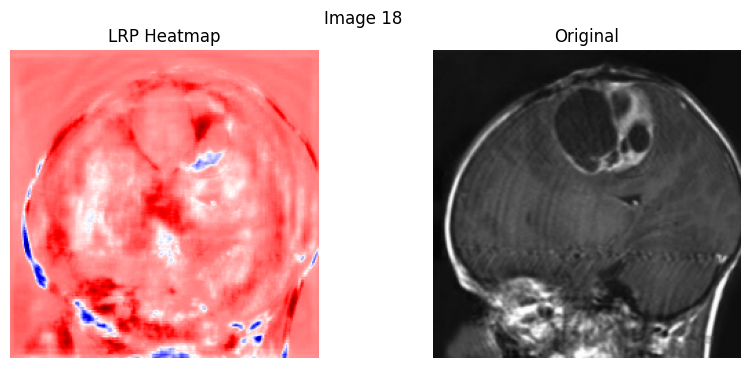


Image 19
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


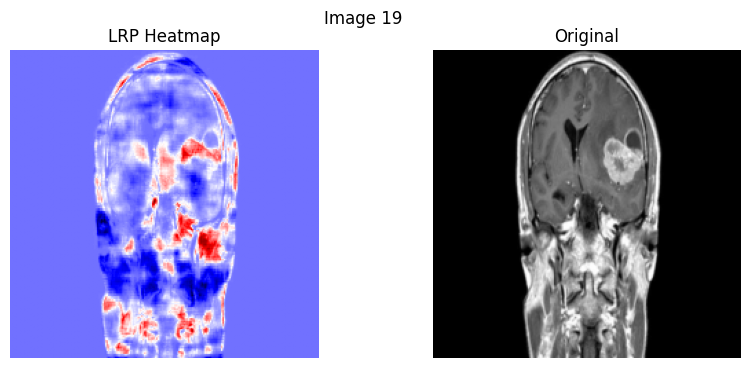


Image 20
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : meningioma_tumor
Correct?  : False


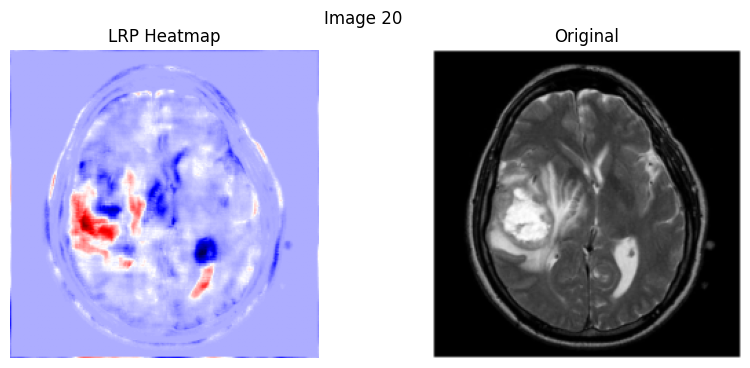


Image 21
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


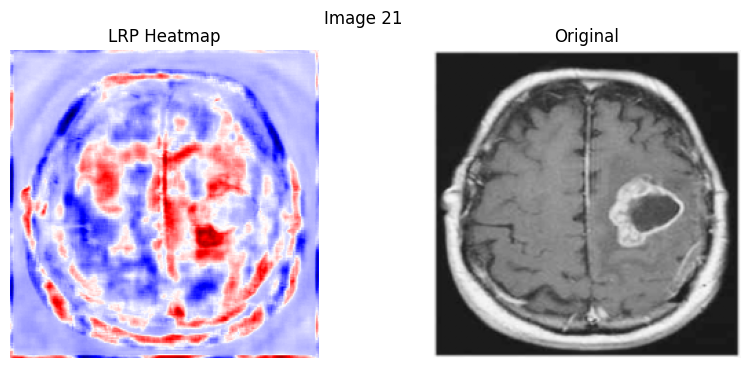


Image 22
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


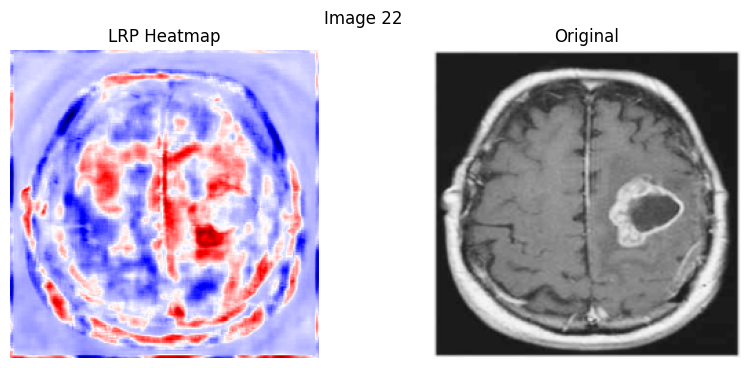


Image 23
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


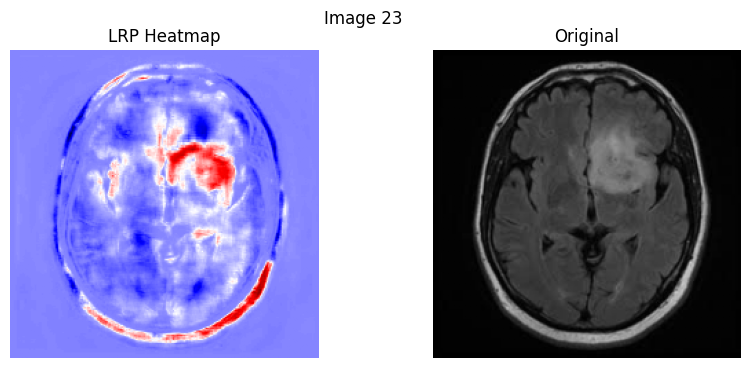


Image 24
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


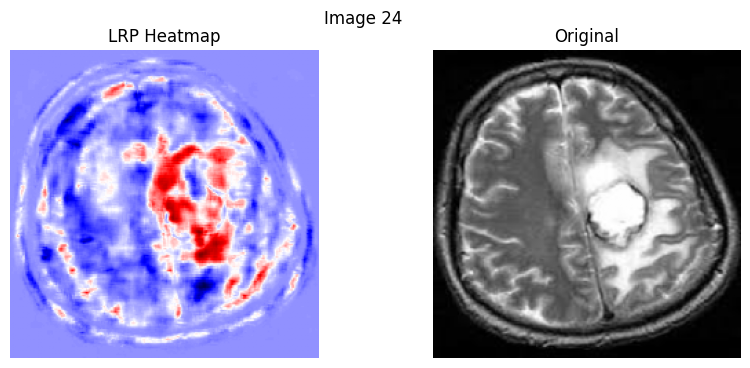


Image 25
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


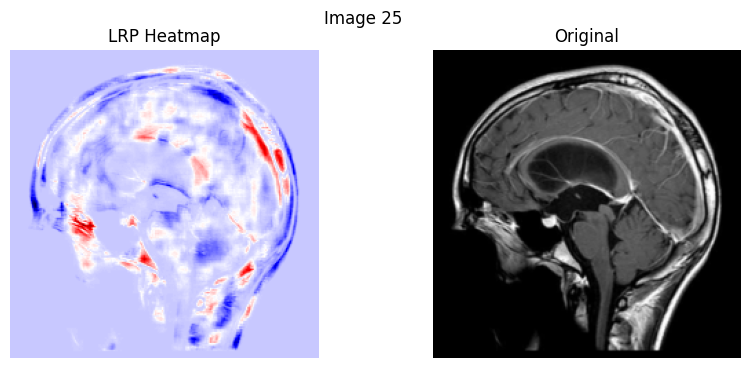


Image 26
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


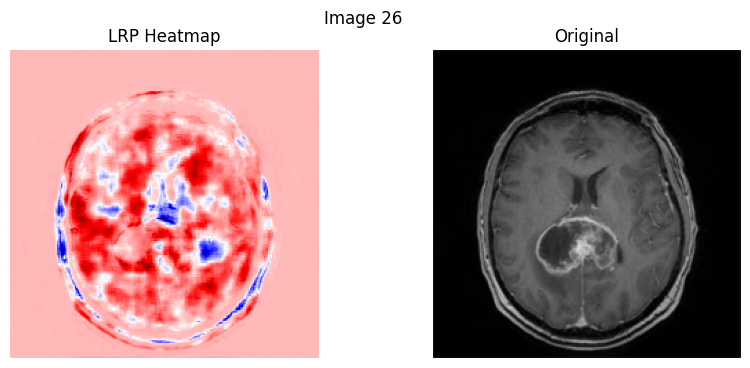


Image 27
Accuracy so far: 1.000
True class: glioma_tumor
Predicted : glioma_tumor
Correct?  : True


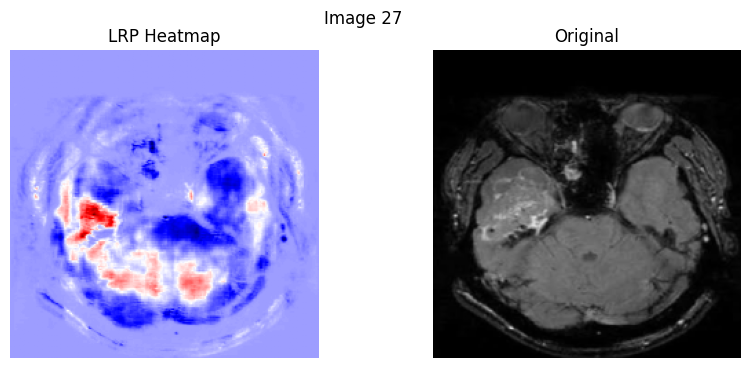


Image 28
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


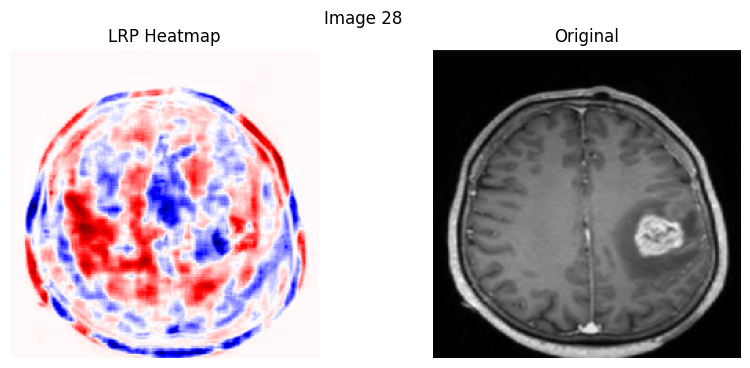


Image 29
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


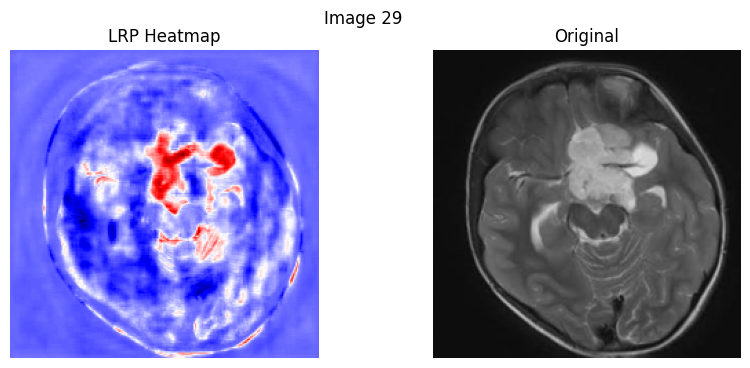


Image 30
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


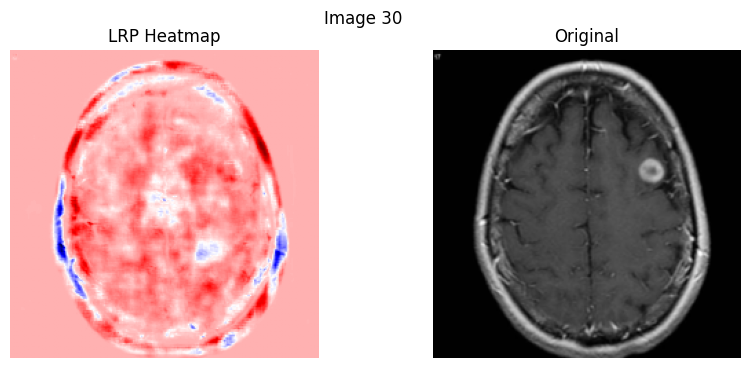


Image 31
Accuracy so far: 0.000
True class: glioma_tumor
Predicted : no_tumor
Correct?  : False


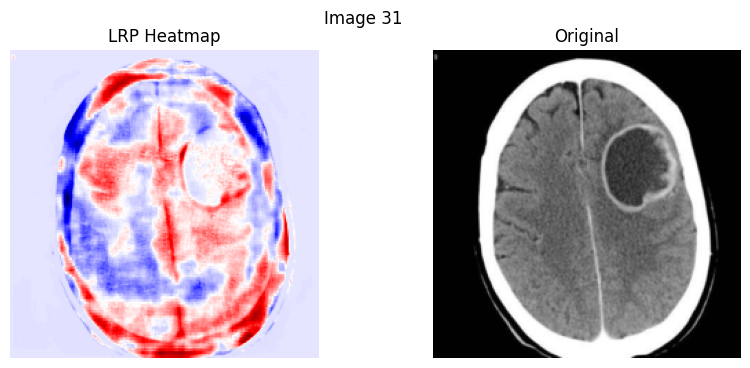

In [15]:
# Implementing LRP to simple CNN
# %%
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision

N = 32
inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)

model.eval()


for i in range(N):
    img = inputs[i].to(device)

    R = apply_lrp_simplecnn(model, img)
    R = R.permute(0,2,3,1).detach().cpu().numpy()[0]
    R = np.interp(R, (R.min(), R.max()), (0,1))

    # ---- Step 2: Ground truth label ----
    pred_label = list(test_dataset.class_to_idx.keys())[
        list(test_dataset.class_to_idx.values()).index(labels[i])
    ]


    print(f"\nImage {i}")

    running_correct = 0
    running_total = 0
    # ---- Step 3: Check model prediction ----
    with torch.no_grad(): # Ensure no gradient calculation for inference
        output = model(img.unsqueeze(0))
        _, predicted = torch.max(output, 1)
    true_label = labels[i].item()
    pred_label = predicted.item()
    correct = (true_label == pred_label)
    running_correct += correct
    running_total += 1
    print(f"Accuracy so far: {running_correct / running_total:.3f}")


    print("True class:", idx_to_class[true_label])
    print("Predicted :", idx_to_class[pred_label])
    print("Correct?  :", true_label == pred_label)

    plt.figure(figsize=(10,4))
    plt.suptitle(f"Image {i}")

    plt.subplot(1,2,1)
    plt.title("LRP Heatmap")
    plt.imshow(R[:,:,0], cmap='seismic')
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Original")
    plt.imshow(inputs[i].permute(1,2,0).cpu().numpy())
    plt.axis("off")

    plt.show()

## Performance metric - AoPC_MoRF

In [16]:
#code for AoPC_MORF
# set the most relevant image pixels to 0
def perturb_most_relevant(img, relevance, num_pixels):
    """
    img:       tensor (1,3,H,W)
    relevance: numpy array (H,W) or (H,W,3)
    num_pixels: number of pixels to perturb
    """
    img = img.clone()

    # Convert heatmap to grayscale relevance if 3-channel, creating an average score per pixel
    if relevance.ndim == 3:
        relevance = relevance.mean(axis=2)

    H, W = relevance.shape # gives height and width of image so we flatten later

    # Flatten + sort pixel indices by relevance (descending) --> most relevant first
    flat_idx = np.argsort(relevance.flatten())[::-1]

    # Take most relevant pixel indices
    top_pixels = flat_idx[:num_pixels]

    # Convert flat indices → 2D coordinates
    xs = top_pixels // W
    ys = top_pixels % W

    # Zero them out in ALL 3 RGB channels
    for x, y in zip(xs, ys):
        img[0, :, x, y] = 0.0

    return img


In [17]:
def compute_morf_curve(model, img, R, steps=20):
    """
    Computes the perturbation curve for MoRF.
    R = relevance map (H,W,3)
    """
    model.eval()

    img = img.unsqueeze(0)   # (1,3,H,W)

    # Base prediction confidence
    with torch.no_grad(): #turn off gradients to make it quicker
        base_output = model(img) # gives tensor of class logits
        base_prob = torch.softmax(base_output, dim=1)[0] #converts logit to prob distrib
        base_class = torch.argmax(base_prob).item() #gives index of highests prob
        base_score = base_prob[base_class].item() #f(x) original score- which is the probability

    H, W = R.shape[:2]
    total_pixels = H * W
    pixels_per_step = total_pixels // steps

    drop_curve = []

    # Running image (gets more perturbed each time)
    perturbed = img.clone()

    for t in range(1, steps+1):
        k = t * pixels_per_step

        # Apply perturbation
        perturbed = perturb_most_relevant(perturbed.clone(), R, k)

        # Repredict
        with torch.no_grad():
            out = model(perturbed)
            prob = torch.softmax(out, dim=1)[0][base_class].item() #f(x)^k)

        drop = base_score - prob #f(x)-f(x)^k)
        drop_curve.append(drop)

    return drop_curve


In [18]:
def compute_aopc(drop_curve):
    return np.mean(drop_curve) # mean(f(x)-f(x)^k)


In [19]:
def find_first_correct_prediction_from_loader(model, loader, device):
    model.eval()

    with torch.no_grad():
        for batch_i, (inputs, labels) in enumerate(loader):

            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Loop through batch for a correct prediction
            for i in range(len(inputs)):
                if preds[i].item() == labels[i].item():
                    print(f"Found correct prediction in batch {batch_i}, index {i}")
                    return inputs[i], labels[i].item(), preds[i].item()

    raise ValueError("No correctly predicted images found in entire test set.")



Found correct prediction in batch 0, index 27
AOPC for selected image: 0.5503


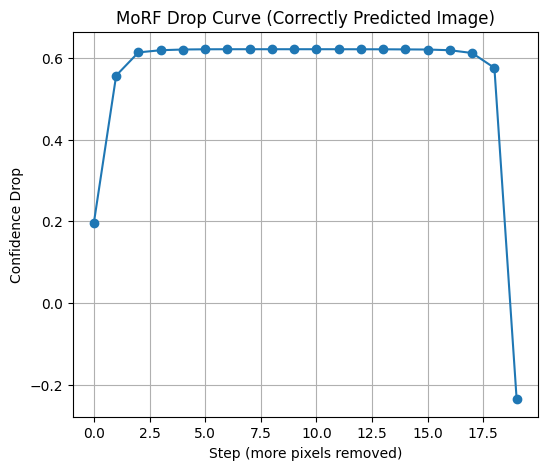

In [20]:
# Get batch
img, true_label, pred_label = find_first_correct_prediction_from_loader(model, test_loader, device)

# inputs, labels = next(iter(test_loader))
# inputs = inputs.to(device)
# labels = labels.to(device)

# # ---- Find correctly predicted image ----
# idx, img, true_label = find_first_correct_prediction(model, inputs, labels)

# ---- Compute LRP heatmap ----
R = apply_lrp_simplecnn(model, img)
R = R.permute(0,2,3,1).detach().cpu().numpy()[0]
R = np.interp(R, (R.min(), R.max()), (0,1))   # Normalize

# ---- Compute MoRF drop curve ----
drop_curve = compute_morf_curve(model, img, R, steps=20)

# ---- Compute AOPC for this sample ----
aopc = compute_aopc(drop_curve)
print(f"AOPC for selected image: {aopc:.4f}")

# ---- Plot drop curve ----
plt.figure(figsize=(6,5))
plt.plot(drop_curve, marker='o')
plt.xlabel("Step (more pixels removed)")
plt.ylabel("Confidence Drop")
plt.title("MoRF Drop Curve (Correctly Predicted Image)")
plt.grid(True)
plt.show()


In [21]:
def show_morf_perturbation_steps(model, img, R, steps=10):
    """
    Visualises the image as more relevant pixels are removed.
    """
    model.eval()

    # Normalize R if needed
    if R.max() > 1:
        R = np.interp(R, (R.min(), R.max()), (0, 1))

    # If 3-channel relevance, convert to grayscale relevance
    if R.ndim == 3:
        Rgray = R.mean(axis=2)
    else:
        Rgray = R

    H, W = Rgray.shape
    total_pixels = H * W
    pixels_per_step = total_pixels // steps

    flat_idx = np.argsort(Rgray.flatten())[::-1]   # Most relevant first

    # Running perturbed image
    perturbed = img.clone().unsqueeze(0)  # (1,3,H,W)

    plt.figure(figsize=(15, 3))

    for t in range(steps + 1):

        # Plot image
        plt.subplot(1, steps+1, t+1)
        plt.imshow(perturbed[0].permute(1,2,0).cpu().numpy())
        plt.title(f"Step {t}")
        plt.axis("off")

        # Apply perturbation for NEXT step
        if t < steps:
            k = (t+1) * pixels_per_step
            top_pixels = flat_idx[:k]

            xs = top_pixels // W
            ys = top_pixels % W

            # Zero out all channels of selected pixels
            for x, y in zip(xs, ys):
                perturbed[0, :, x, y] = 0.0

    plt.suptitle("MoRF Perturbation Progression", fontsize=16)
    plt.show()


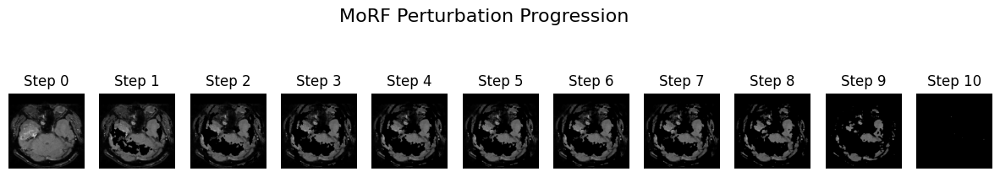

In [22]:
show_morf_perturbation_steps(model, img, R, steps=10)


### Applying AoPC_MoRF to LRP with simple CNN

In [23]:
all_aopc = []
N = 32

inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)

model.eval()

for i in range(N):
    img = inputs[i].to(device)

    # ---- LRP relevance ----
    R = apply_lrp_simplecnn(model, img)
    R = R.permute(0,2,3,1).detach().cpu().numpy()[0] #changes the shape so can be used for an image
    R = np.interp(R, (R.min(), R.max()), (0,1)) #normalises the heat map to be in (0,1) range

    # ---- Compute MoRF curve ----
    drop_curve = compute_morf_curve(model, img, R, steps=20)

    # ---- Compute AOPC ----
    aopc = compute_aopc(drop_curve)
    all_aopc.append(aopc)

    print(f"Image {i} AOPC_MoRF = {aopc:.4f}")

# Final score across the dataset
print("\nAverage AOPC_MoRF across test images:", np.mean(all_aopc))


Image 0 AOPC_MoRF = 0.7955
Image 1 AOPC_MoRF = -0.1454
Image 2 AOPC_MoRF = -0.1431
Image 3 AOPC_MoRF = 0.2480
Image 4 AOPC_MoRF = 0.2480
Image 5 AOPC_MoRF = 0.7896
Image 6 AOPC_MoRF = 0.6392
Image 7 AOPC_MoRF = 0.3341
Image 8 AOPC_MoRF = 0.4665
Image 9 AOPC_MoRF = 0.9257
Image 10 AOPC_MoRF = 0.9051
Image 11 AOPC_MoRF = 0.7132
Image 12 AOPC_MoRF = 0.6410
Image 13 AOPC_MoRF = 0.9175
Image 14 AOPC_MoRF = 0.6876
Image 15 AOPC_MoRF = 0.9024
Image 16 AOPC_MoRF = 0.8574
Image 17 AOPC_MoRF = 0.7994
Image 18 AOPC_MoRF = 0.5518
Image 19 AOPC_MoRF = 0.9097
Image 20 AOPC_MoRF = 0.4915
Image 21 AOPC_MoRF = 0.8477
Image 22 AOPC_MoRF = 0.8477
Image 23 AOPC_MoRF = 0.7654
Image 24 AOPC_MoRF = 0.9368
Image 25 AOPC_MoRF = 0.0332
Image 26 AOPC_MoRF = -0.0145
Image 27 AOPC_MoRF = 0.5503
Image 28 AOPC_MoRF = -0.2675
Image 29 AOPC_MoRF = 0.8942
Image 30 AOPC_MoRF = 0.4577
Image 31 AOPC_MoRF = 0.8531

Average AOPC_MoRF across test images: 0.5762021821839326


In [24]:
def evaluate_accuracy(model, dataloader, device):
    model.eval()            # set model to evaluation mode
    correct = 0
    total = 0

    with torch.no_grad():   # no gradients needed
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)                 # forward pass
            _, predicted = torch.max(outputs, 1)    # class with highest score

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = correct / total
    return accuracy


In [25]:
acc = evaluate_accuracy(model, test_loader, device)
print(f"Test Accuracy: {acc*100:.2f}%")


Test Accuracy: 52.28%


## LRP applied to CNN with vgg16

True


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:06<00:00, 91.7MB/s]


tensor(1.4219, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.4090, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.3055, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.3733, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2776, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.3381, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.3299, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2571, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2883, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2014, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.1873, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.0354, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2594, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2116, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.1496, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.0974, device='cuda:0', grad_fn=<NllLossBackward0>)
tensor(1.2059, device='cuda:0', grad_fn=

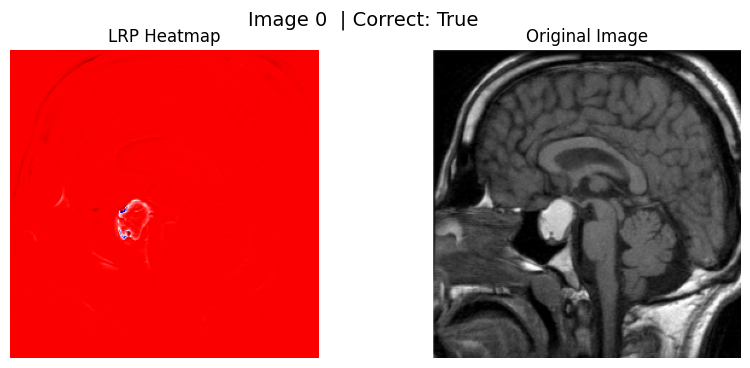

True class: meningioma_tumor

Image 1
Groundtruth: meningioma_tumor
Correctly classified? True


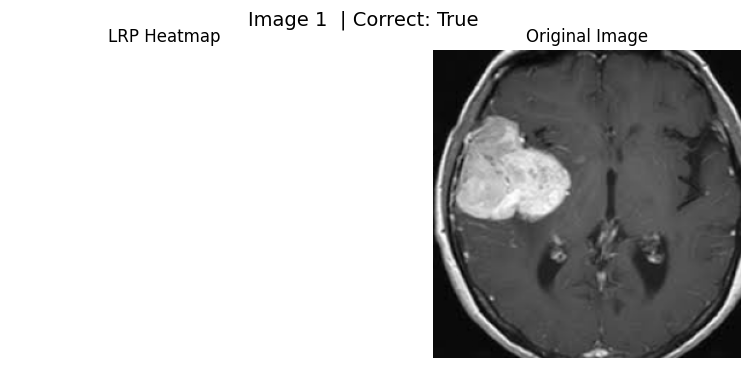

True class: glioma_tumor

Image 2
Groundtruth: glioma_tumor
Correctly classified? False


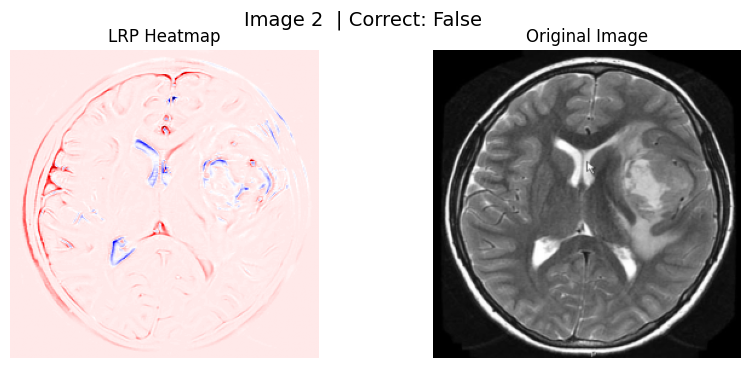

True class: no_tumor

Image 3
Groundtruth: no_tumor
Correctly classified? True


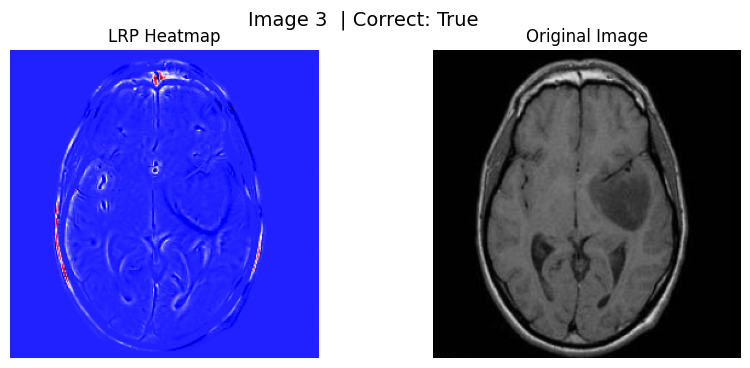

True class: no_tumor

Image 4
Groundtruth: no_tumor
Correctly classified? True


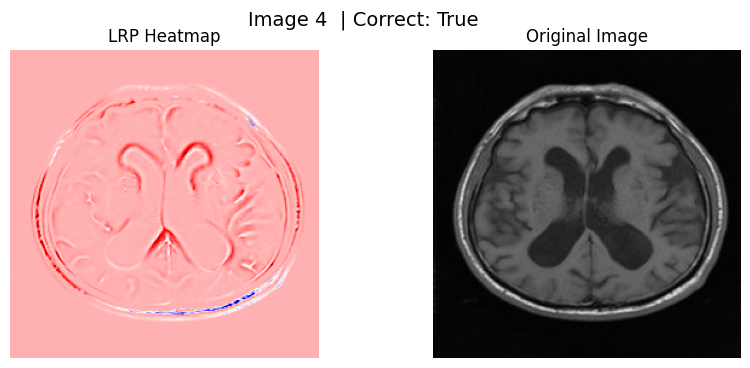

True class: meningioma_tumor

Image 5
Groundtruth: meningioma_tumor
Correctly classified? True


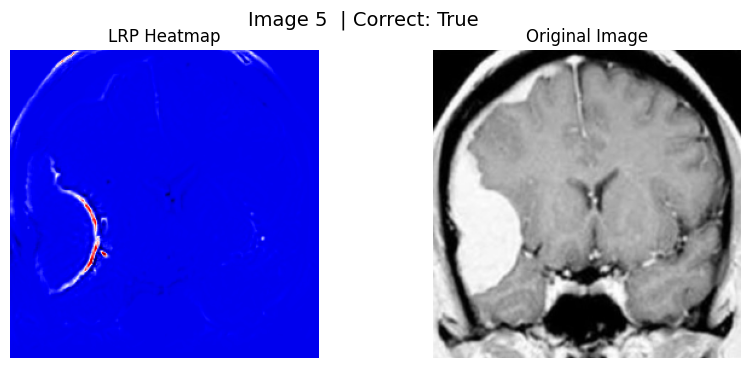

True class: meningioma_tumor

Image 6
Groundtruth: meningioma_tumor
Correctly classified? True


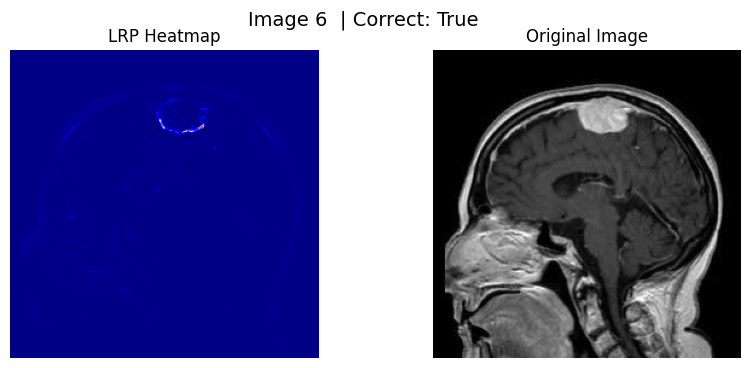

True class: meningioma_tumor

Image 7
Groundtruth: meningioma_tumor
Correctly classified? True


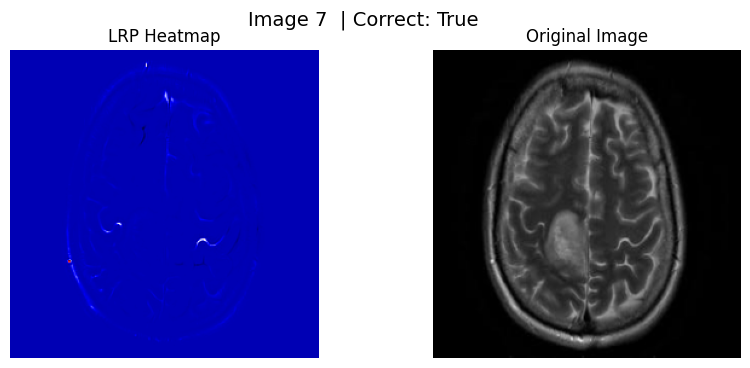

True class: meningioma_tumor

Image 8
Groundtruth: meningioma_tumor
Correctly classified? True


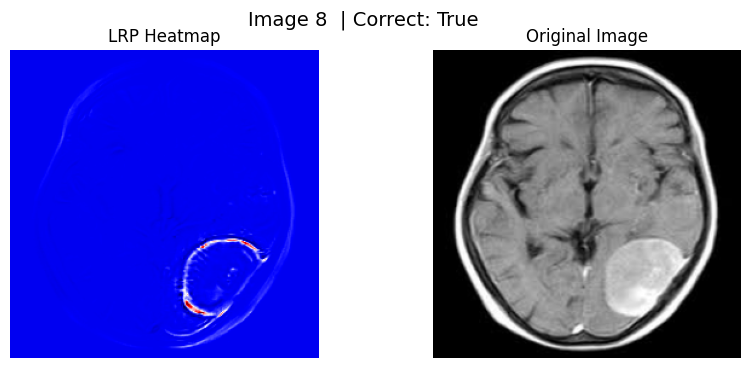

True class: glioma_tumor

Image 9
Groundtruth: glioma_tumor
Correctly classified? True


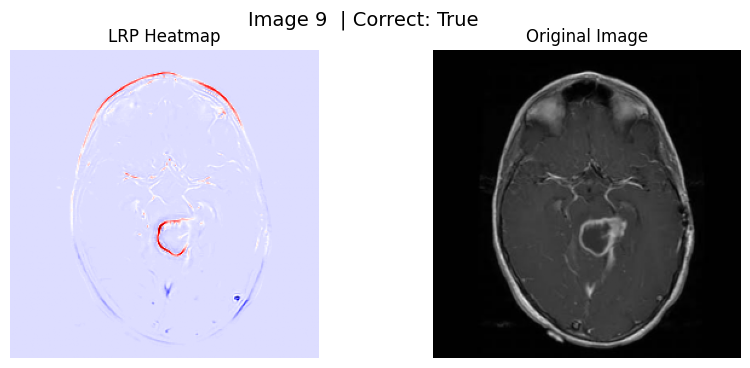

In [26]:
#code from https://github.com/deepfindr/xai-series/blob/master/05_lrp.py

import torch
import torch.nn as nn
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
import copy
import pandas as pd

# Set GPU device
print(torch.cuda.is_available())
device = torch.device("cuda:0")


# %% Load data
TRAIN_ROOT = "/content/data/Training"
TEST_ROOT = "/content/data/Testing"
train2_dataset = torchvision.datasets.ImageFolder(root=TRAIN_ROOT)
test2_dataset = torchvision.datasets.ImageFolder(root=TRAIN_ROOT)


# %% Building the model
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.vgg16 = models.vgg16(pretrained=True)

        # Replace output layer according to our problem
        in_feats = self.vgg16.classifier[6].in_features
        self.vgg16.classifier[6] = nn.Linear(in_feats, 4)

    def forward(self, x):
        x = self.vgg16(x)
        return x

model2 = CNNModel()
model2.to(device)
model2

# %% Prepare data for pretrained model
train2_dataset = torchvision.datasets.ImageFolder(
        root=TRAIN_ROOT,
        transform=transforms.Compose([
                      transforms.Resize((255,255)),
                      transforms.ToTensor()
        ])
)

test2_dataset = torchvision.datasets.ImageFolder(
        root=TEST_ROOT,
        transform=transforms.Compose([
                      transforms.Resize((255,255)),
                      transforms.ToTensor()
        ])
)


# %% Create data loaders
batch_size = 32
train2_loader = torch.utils.data.DataLoader(
    train2_dataset,
    batch_size=batch_size,
    shuffle=True
)
test2_loader = torch.utils.data.DataLoader(
    test2_dataset,
    batch_size=batch_size,
    shuffle=True
)

# %% Train
cross_entropy_loss = nn.CrossEntropyLoss()
optimizer2 = optim.Adam(model2.parameters(), lr=0.00001)
epochs = 10

# Iterate x epochs over the train data
for epoch in range(epochs):
    for i, batch in enumerate(train2_loader, 0):
        inputs, labels = batch
        inputs = inputs.to(device)
        labels = labels.to(device)
        optimizer2.zero_grad()
        outputs = model2(inputs)
        # Labels are automatically one-hot-encoded
        loss = cross_entropy_loss(outputs, labels)
        loss.backward()
        optimizer2.step()
        print(loss)

# %% Inspect predictions for first batch
import pandas as pd
inputs, labels = next(iter(test2_loader))
inputs = inputs.to(device)
labels = labels.numpy()
outputs = model2(inputs).max(1).indices.detach().cpu().numpy()
comparison = pd.DataFrame()
print("Batch accuracy: ", (labels==outputs).sum()/len(labels))
comparison["labels"] = labels

comparison["outputs"] = outputs
comparison

# %% Layerwise relevance propagation for VGG16
# For other CNN architectures this code might become more complex
# Source: https://git.tu-berlin.de/gmontavon/lrp-tutorial
# http://iphome.hhi.de/samek/pdf/MonXAI19.pdf





def dense_to_conv(layers):
    """ Converts a dense layer to a conv layer """
    newlayers = []
    for i,layer in enumerate(layers):
        if isinstance(layer, nn.Linear):
            newlayer = None
            if i == 0:
                m, n = 512, layer.weight.shape[0]
                newlayer = nn.Conv2d(m,n,7)
                newlayer.weight = nn.Parameter(layer.weight.reshape(n,m,7,7))
            else:
                m,n = layer.weight.shape[1],layer.weight.shape[0]
                newlayer = nn.Conv2d(m,n,1)
                newlayer.weight = nn.Parameter(layer.weight.reshape(n,m,1,1))
            newlayer.bias = nn.Parameter(layer.bias)
            newlayers += [newlayer]
        else:
            newlayers += [layer]
    return newlayers

def get_linear_layer_indices(model):
    offset = len(model.vgg16._modules['features']) + 1
    indices = []
    for i, layer in enumerate(model.vgg16._modules['classifier']):
        if isinstance(layer, nn.Linear):
            indices.append(i)
    indices = [offset + val for val in indices]
    return indices

def apply_lrp_on_vgg16(model, image):
    image = torch.unsqueeze(image, 0)
    # >>> Step 1: Extract layers
    layers = list(model.vgg16._modules['features']) \
                + [model.vgg16._modules['avgpool']] \
                + dense_to_conv(list(model.vgg16._modules['classifier']))
    linear_layer_indices = get_linear_layer_indices(model)
    # >>> Step 2: Propagate image through layers and store activations
    n_layers = len(layers)
    activations = [image] + [None] * n_layers # list of activations

    for layer in range(n_layers):
        if layer in linear_layer_indices:
            if layer == 32:
                activations[layer] = activations[layer].reshape((1, 512, 7, 7))
        activation = layers[layer].forward(activations[layer])
        if isinstance(layers[layer], torch.nn.modules.pooling.AdaptiveAvgPool2d):
            activation = torch.flatten(activation, start_dim=1)
        activations[layer+1] = activation
    # >>> Step 3: Replace last layer with proper one-hot encoding
    scores = activations[-1].detach().clone()            # Shape: (1, num_classes)
    pred_class = torch.argmax(scores, dim=1).item()      # Get predicted class
    one_hot_output = torch.zeros_like(scores)            # Make empty tensor
    one_hot_output[0, pred_class] = scores[0, pred_class] # Assign relevance

    activations[-1] = one_hot_output.to(device)


    # >>> Step 4: Backpropagate relevance scores
    relevances = [None] * n_layers + [activations[-1]]
    # Iterate over the layers in reverse order
    for layer in range(0, n_layers)[::-1]:
        current = layers[layer]
        # Treat max pooling layers as avg pooling
        if isinstance(current, torch.nn.MaxPool2d):
            layers[layer] = torch.nn.AvgPool2d(2)
            current = layers[layer]
        if isinstance(current, torch.nn.Conv2d) or \
           isinstance(current, torch.nn.AvgPool2d) or\
           isinstance(current, torch.nn.Linear):
            activations[layer] = activations[layer].data.requires_grad_(True)

            # Apply variants of LRP depending on the depth
            # see: https://link.springer.com/chapter/10.1007%2F978-3-030-28954-6_10
            # Lower layers, LRP-gamma >> Favor positive contributions (activations)
            if layer <= 16:       rho = lambda p: p + 0.25*p.clamp(min=0); incr = lambda z: z+1e-9
            # Middle layers, LRP-epsilon >> Remove some noise / Only most salient factors survive
            if 17 <= layer <= 30: rho = lambda p: p;                       incr = lambda z: z+1e-9+0.25*((z**2).mean()**.5).data
            # Upper Layers, LRP-0 >> Basic rule
            if layer >= 31:       rho = lambda p: p;                       incr = lambda z: z+1e-9

            # Transform weights of layer and execute forward pass
            z = incr(new_layer(layers[layer],rho).forward(activations[layer]))
            # Element-wise division between relevance of the next layer and z
            s = (relevances[layer+1]/z).data
            # Calculate the gradient and multiply it by the activation
            (z * s).sum().backward();
            c = activations[layer].grad
            # Assign new relevance values
            relevances[layer] = (activations[layer]*c).data
        else:
            relevances[layer] = relevances[layer+1]

    # >>> Potential Step 5: Apply different propagation rule for pixels
    return relevances[0]

# %%

N = 10  # number of images to show

for image_id in range(N):

    # ---- Step 1: Compute relevance for this image ----
    image_relevances = apply_lrp_on_vgg16(model2, inputs[image_id])
    image_relevances = image_relevances.permute(0,2,3,1).detach().cpu().numpy()[0]

    # Normalize relevance map
    image_relevances = np.interp(
        image_relevances,
        (image_relevances.min(), image_relevances.max()),
        (0, 1)
    )

    # ---- Step 2: Ground truth label ----
    pred_label = list(test2_dataset.class_to_idx.keys())[
        list(test2_dataset.class_to_idx.values()).index(labels[image_id])
    ]
    true_label = labels[image_id].item()


    print("True class:", idx_to_class[true_label])
    print(f"\nImage {image_id}")
    print("Groundtruth:", pred_label)

    # ---- Step 3: Check model prediction ----
    correct = (outputs[image_id] == labels[image_id])
    print("Correctly classified?" , correct)

    # ---- Step 4: Plot results ----
    plt.figure(figsize=(10,4))
    plt.suptitle(f"Image {image_id}  | Correct: {correct}", fontsize=14)

    # LRP heatmap
    plt.subplot(1,2,1)
    plt.title("LRP Heatmap")
    plt.axis("off")
    plt.imshow(image_relevances[:,:,0], cmap="seismic")

    # Original MRI image
    plt.subplot(1,2,2)
    plt.title("Original Image")
    plt.axis("off")
    plt.imshow(inputs[image_id].permute(1,2,0).detach().cpu().numpy())

    plt.show()

In [27]:
acc = evaluate_accuracy(model2, test2_loader, device)
print(f"Test Accuracy: {acc*100:.2f}%")


Test Accuracy: 78.68%


### Applying AoPC_MoRF to LRP with vgg16 CNN model

In [28]:
all_aopc = []
N = 32

inputs, labels = next(iter(test2_loader))
inputs = inputs.to(device)
labels = labels.to(device)

model2.eval()

for i in range(N):
    img = inputs[i].to(device)

    # ---- LRP relevance ----

    R = apply_lrp_on_vgg16(model2, img)
    R = R.permute(0,2,3,1).detach().cpu().numpy()[0]
    R = np.interp(R, (R.min(), R.max()), (0,1))

    # ---- Compute MoRF curve ----
    drop_curve = compute_morf_curve(model2, img, R, steps=20)

    # ---- Compute AOPC ----
    aopc = compute_aopc(drop_curve)
    all_aopc.append(aopc)

    print(f"Image {i} AOPC_MoRF = {aopc:.4f}")

# Final score across the dataset
print("\nAverage AOPC_MoRF across test images:", np.mean(all_aopc))


Image 0 AOPC_MoRF = 0.9538
Image 1 AOPC_MoRF = 0.5388
Image 2 AOPC_MoRF = 0.9083
Image 3 AOPC_MoRF = 0.9852
Image 4 AOPC_MoRF = 0.1367
Image 5 AOPC_MoRF = 0.9869
Image 6 AOPC_MoRF = 0.0688
Image 7 AOPC_MoRF = 0.0823
Image 8 AOPC_MoRF = 0.0761
Image 9 AOPC_MoRF = 0.2957
Image 10 AOPC_MoRF = 0.5140
Image 11 AOPC_MoRF = 0.9921
Image 12 AOPC_MoRF = 0.2458
Image 13 AOPC_MoRF = 0.9875
Image 14 AOPC_MoRF = 0.9157
Image 15 AOPC_MoRF = 0.7393
Image 16 AOPC_MoRF = 0.4791
Image 17 AOPC_MoRF = 0.2646
Image 18 AOPC_MoRF = 0.7981
Image 19 AOPC_MoRF = 0.5198
Image 20 AOPC_MoRF = 0.0782
Image 21 AOPC_MoRF = 0.1511
Image 22 AOPC_MoRF = 0.8699
Image 23 AOPC_MoRF = 0.5700
Image 24 AOPC_MoRF = 0.9784
Image 25 AOPC_MoRF = 0.1511
Image 26 AOPC_MoRF = 0.1808
Image 27 AOPC_MoRF = 0.6630
Image 28 AOPC_MoRF = 0.9895
Image 29 AOPC_MoRF = 0.9857
Image 30 AOPC_MoRF = 0.2097
Image 31 AOPC_MoRF = 0.9859

Average AOPC_MoRF across test images: 0.5719392300988967


Found correct prediction in batch 0, index 0
AOPC for selected image: 0.1523


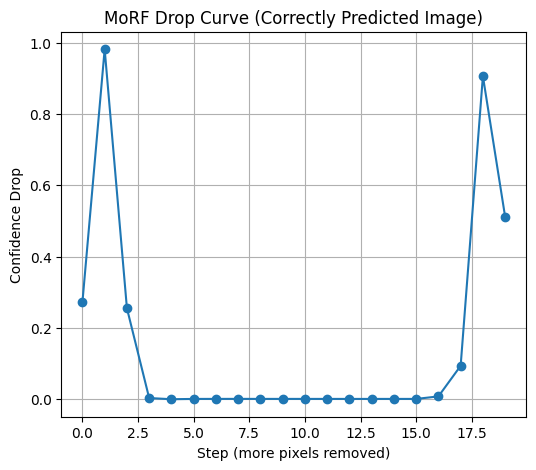

In [29]:
img2, true_label2, pred_label2 = find_first_correct_prediction_from_loader(model2, test2_loader, device)

# inputs, labels = next(iter(test_loader))
# inputs = inputs.to(device)
# labels = labels.to(device)

# # ---- Find correctly predicted image ----
# idx, img, true_label = find_first_correct_prediction(model, inputs, labels)

# ---- Compute LRP heatmap ----
R2 = apply_lrp_on_vgg16(model2, img2)
R2 = R2.permute(0,2,3,1).detach().cpu().numpy()[0]
R2 = np.interp(R2, (R2.min(), R2.max()), (0,1))   # Normalize

# ---- Compute MoRF drop curve ----
drop_curve = compute_morf_curve(model2, img2, R2, steps=20)

# ---- Compute AOPC for this sample ----
aopc = compute_aopc(drop_curve)
print(f"AOPC for selected image: {aopc:.4f}")

# ---- Plot drop curve ----
plt.figure(figsize=(6,5))
plt.plot(drop_curve, marker='o')
plt.xlabel("Step (more pixels removed)")
plt.ylabel("Confidence Drop")
plt.title("MoRF Drop Curve (Correctly Predicted Image)")
plt.grid(True)
plt.show()


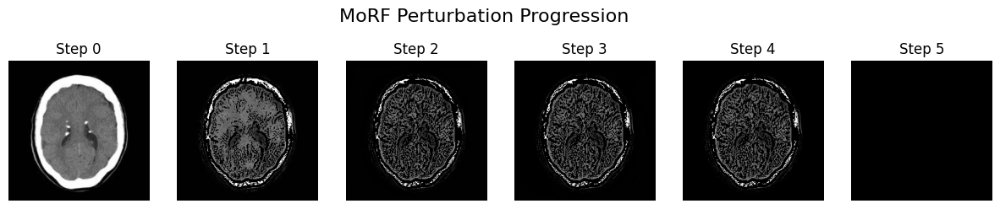

In [30]:
show_morf_perturbation_steps(model2, img2, R2, steps=5)

In [34]:
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 21.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 106.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jax 0.7.2 requires numpy>=2.0, but you have numpy 1.26.4 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
shap 0.50.0 requires numpy>=2, but you have numpy 1.26.4 which is incompatible.
opencv-contrib-python 4

https://captum.ai/api/lrp.html

In [35]:
import torch
from captum.attr import LRP
import matplotlib.pyplot as plt

In [39]:
#Cannot use simpleCNN as model when using caputm LRP as it includes flatten

# N= 32
# inputs, labels = next(iter(test_loader))
# inputs = inputs.to(device)
# labels = labels.to(device)
# model.eval()
# for i in range(N):
#     img = inputs[i].unsqueeze(0)
#     img = img.to(device)
# # pick an image from your dataset
# # img = inputs[0].unsqueeze(0)       # shape [1, 3, H, W]
# # img = img.to(device)

# # predicted class
#     with torch.no_grad():
#         output = model(img)
#     pred_class = output.argmax(dim=1).item()

# # ---- Captum LRP ----
#     lrp = LRP(model)
#     R = lrp.attribute(img, target=pred_class)

#     # Convert relevance to numpy
#     R = R.squeeze().detach().cpu().numpy()

#     # Plot heatmap
#     plt.figure(figsize=(4,4))
#     plt.imshow(R[0], cmap='seismic')  # channel 0 or summed across channels
#     plt.colorbar()
#     plt.title("LRP heatmap")
#     plt.show()


### changing simple CNN code so I can use captum LRP


In [37]:
import torch.nn as nn

class AdaptedSimpleCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, 3, padding=1),
            nn.ReLU(), #applies non linearity
            nn.MaxPool2d(2), #reduce spatial size and keep important features

            nn.Conv2d(16, 32, 3, padding=1), #16 features to 32 outputs
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.fc = nn.Sequential(
            nn.Linear(32 * 56 * 56, 64), #convetrs map to 64 neurons
            nn.ReLU(),
            nn.Linear(64, len(train_dataset.classes)), #64 goes to 4 tumor classes
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)      # Flatten manually — SAFE for Captum LRP
        x = self.fc(x)
        return x



In [38]:
model3 = AdaptedSimpleCNN()
model3 = model3.to(device)

criterion = torch.nn.CrossEntropyLoss() #
optimizer = torch.optim.Adam(model3.parameters(), lr=1e-4)
epochs = 5  # increase later

for epoch in range(epochs):
    model3.train() #into trianing mode
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model3(images) #puts MRI j
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step() #wher emodel learns tumour features

        running_loss += loss.item()

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = correct / total * 100
    print(f"Epoch [{epoch+1}/{epochs}]  Loss: {running_loss:.4f}  Train Acc: {train_acc:.2f}%")


Epoch [1/5]  Loss: 102.0814  Train Acc: 51.71%
Epoch [2/5]  Loss: 70.6976  Train Acc: 67.04%
Epoch [3/5]  Loss: 59.6446  Train Acc: 73.52%
Epoch [4/5]  Loss: 51.4128  Train Acc: 77.28%
Epoch [5/5]  Loss: 47.1704  Train Acc: 79.41%


/usr/local/lib/python3.12/dist-packages/captum/attr/_core/lrp.py:207: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(input_tuple)


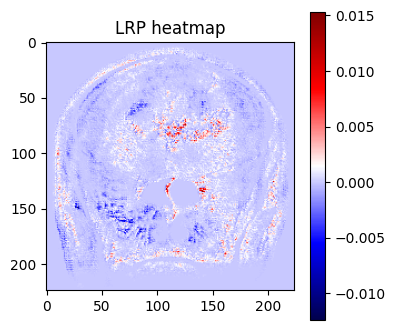

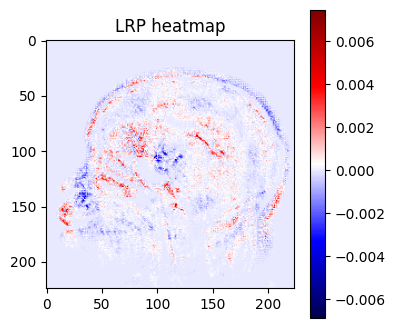

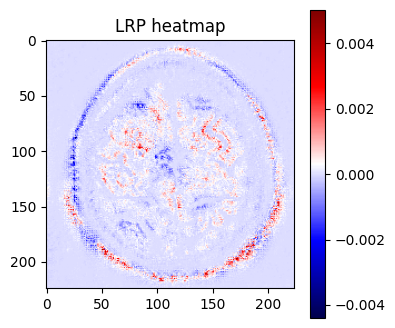

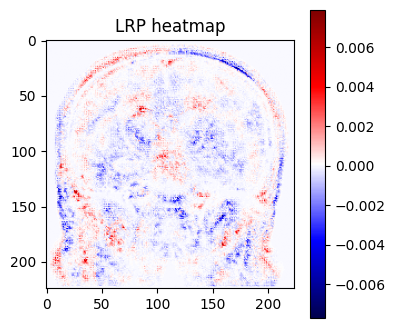

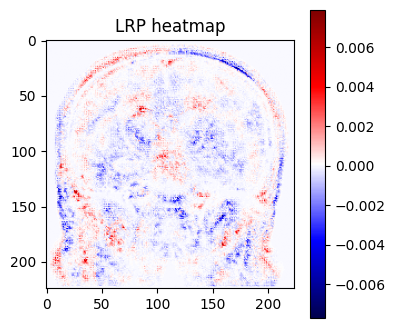

...

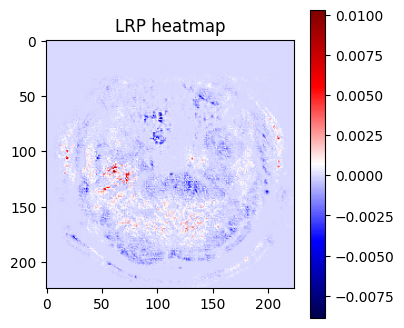

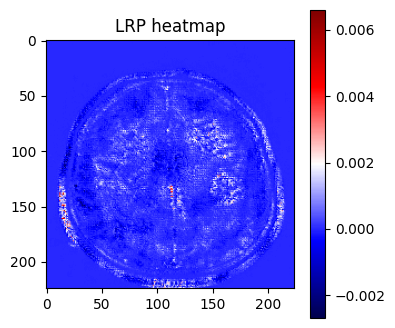

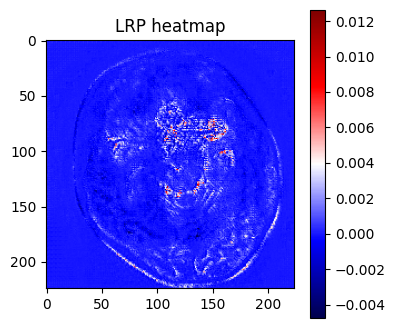

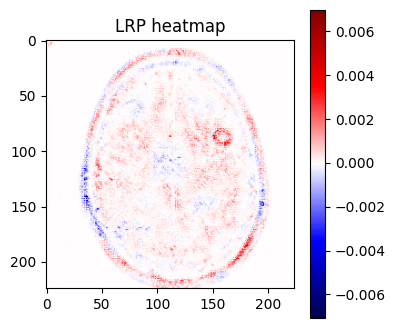

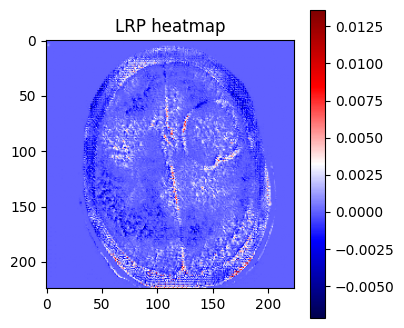

In [40]:


N= 32
inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)
model3.eval()
for i in range(N):
    img = inputs[i].unsqueeze(0)
    img = img.to(device)
# pick an image from your dataset
# img = inputs[0].unsqueeze(0)       # shape [1, 3, H, W]
# img = img.to(device)

# predicted class
    with torch.no_grad():
        output = model3(img)
    pred_class = output.argmax(dim=1).item()

# ---- Captum LRP ----
    lrp = LRP(model3)
    R = lrp.attribute(img, target=pred_class)

    # Convert relevance to numpy
    R = R.squeeze().detach().cpu().numpy()

    # Plot heatmap
    plt.figure(figsize=(4,4))
    plt.imshow(R[0], cmap='seismic')  # channel 0 or summed across channels
    plt.colorbar()
    plt.title("LRP heatmap")
    plt.show()


### Running captum LRP on VGG16

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


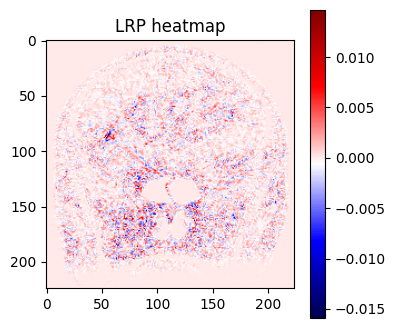

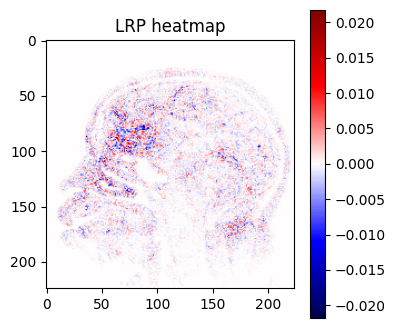

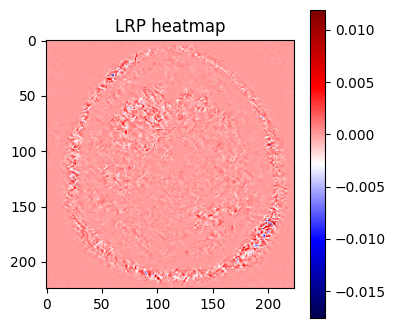

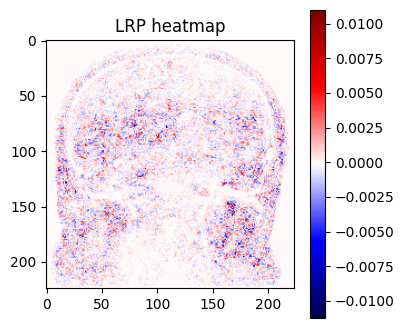

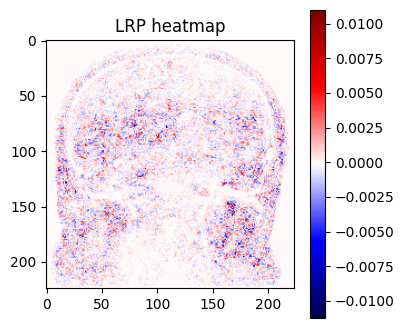

...

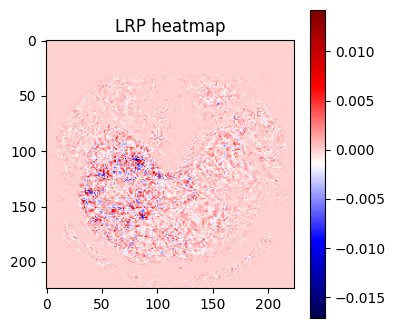

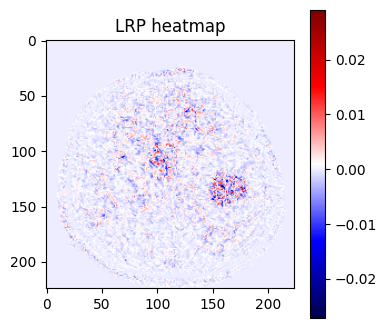

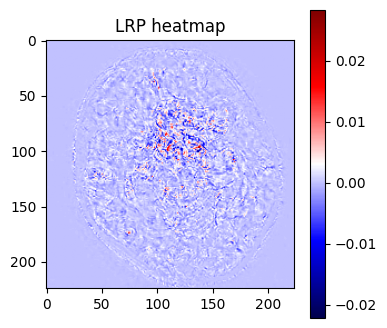

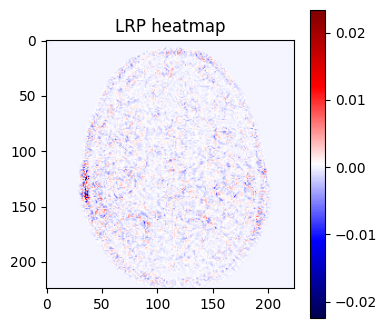

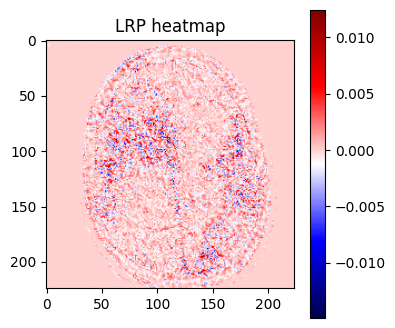

In [41]:
model2 = CNNModel()
model2.to(device)
model2
N= 32
inputs, labels = next(iter(test_loader))
inputs = inputs.to(device)
labels = labels.to(device)
model2.eval()
for i in range(N):
    img = inputs[i].unsqueeze(0)
    img = img.to(device)
# pick an image from your dataset
# img = inputs[0].unsqueeze(0)       # shape [1, 3, H, W]
# img = img.to(device)

# predicted class
    with torch.no_grad():
        output = model2(img)
    pred_class = output.argmax(dim=1).item()

# ---- Captum LRP ----
    lrp = LRP(model2)
    R = lrp.attribute(img, target=pred_class)

    # Convert relevance to numpy
    R = R.squeeze().detach().cpu().numpy()

    # Plot heatmap
    plt.figure(figsize=(4,4))
    plt.imshow(R[0], cmap='seismic')  # channel 0 or summed across channels
    plt.colorbar()
    plt.title("LRP heatmap")
    plt.show()


Noted that the images when using the3 vgg16 model for the derived LRP code visually seem better than the captum LRP code